### Task 1: Predictive Modeling (Classification)
Description: Build and evaluate a classification model to predict categorical outcomes (e.g., predict if acustomer will churn)
- Preprocess the data (handle categorical variables,feature scaling).
- Train and test multiple classification models (e.g.,Decision Trees, Logistic Regression, Random Forest).
- Evaluate models using accuracy, precision, recall, andF1-score.Perform hyperparameter tuning using grid search.
- Tools: Python, scikit-learn, pandas, matplotlib.




In [1]:
### Importing Libraries

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
sns.set_style("darkgrid")

import warnings

warnings.filterwarnings("ignore")

In [2]:
file_path = r"C:\Users\DELL\Downloads\Codveta Internship\datasets\churn-bigml-80.csv"

In [3]:
df = pd.read_csv(file_path)

In [4]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [5]:
### Check dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [6]:
#### Checking the dataset shape

df.shape

(2666, 20)

In [7]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [8]:
### Checking for Null values in the dataset
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [9]:
### Checking the descriptive statistics of the numerical values

df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [10]:
df.select_dtypes(include='number').columns

Index(['Account length', 'Area code', 'Number vmail messages',
       'Total day minutes', 'Total day calls', 'Total day charge',
       'Total eve minutes', 'Total eve calls', 'Total eve charge',
       'Total night minutes', 'Total night calls', 'Total night charge',
       'Total intl minutes', 'Total intl calls', 'Total intl charge',
       'Customer service calls'],
      dtype='object')

In [11]:
### Handling Categorical variables

df.select_dtypes(include='object').columns
categorical_variable = ['State', 'International plan', 'Voice mail plan']

Numerical_variable = ['Account length', 'Area code', 'Number vmail messages',
       'Total day minutes', 'Total day calls', 'Total day charge',
       'Total eve minutes', 'Total eve calls', 'Total eve charge',
       'Total night minutes', 'Total night calls', 'Total night charge',
       'Total intl minutes', 'Total intl calls', 'Total intl charge',
       'Customer service calls']

print(F"The categorical variable: {categorical_variable}")

print(f"The Numerical variable: {Numerical_variable}")


The categorical variable: ['State', 'International plan', 'Voice mail plan']
The Numerical variable: ['Account length', 'Area code', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']


In [12]:
df[categorical_variable]

,State,International plan,Voice mail plan
0,KS,No,Yes
1,OH,No,Yes
2,NJ,No,No
3,OH,Yes,No
4,OK,Yes,No
...,...,...,...
2661,SC,No,No
2662,AZ,No,Yes
2663,WV,No,No
2664,RI,No,No


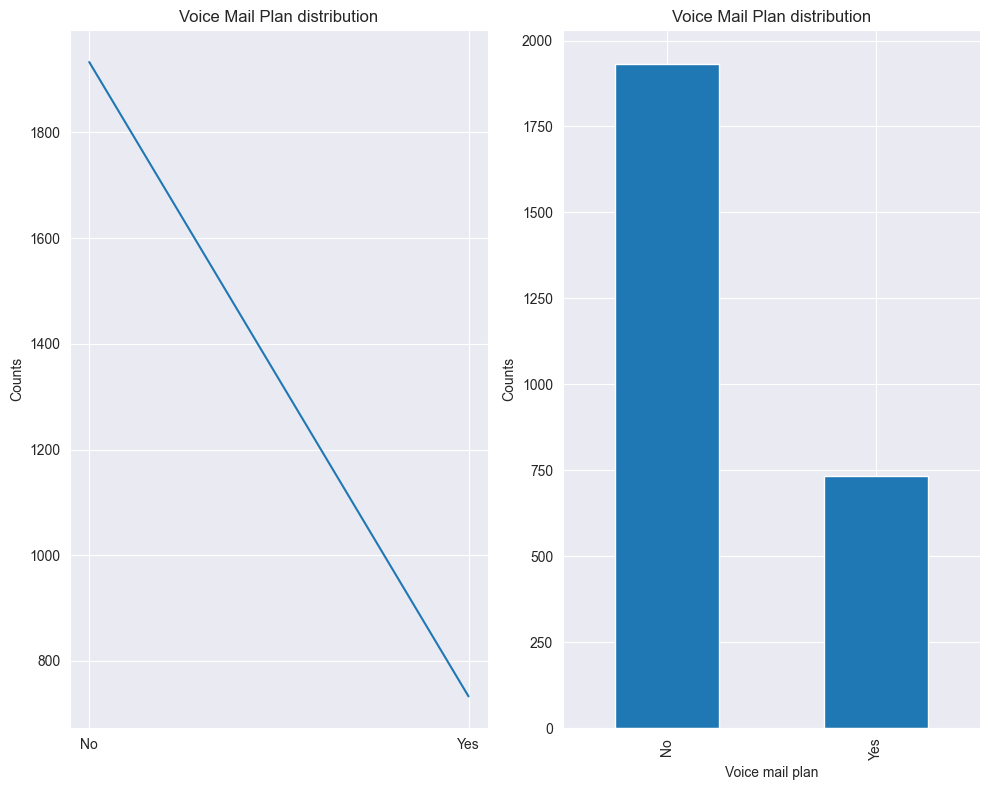

In [13]:
fig,axes = plt.subplots(1,2,figsize=(10,8))
axes[0].plot(df[categorical_variable]['Voice mail plan'].value_counts())

axes[0].set_title("Voice Mail Plan distribution")
axes[0].set_ylabel("Counts")

df[categorical_variable]['Voice mail plan'].value_counts().plot(kind='bar')
axes[1].set_title("Voice Mail Plan distribution")
axes[1].set_ylabel("Counts")

plt.tight_layout()
plt.show()






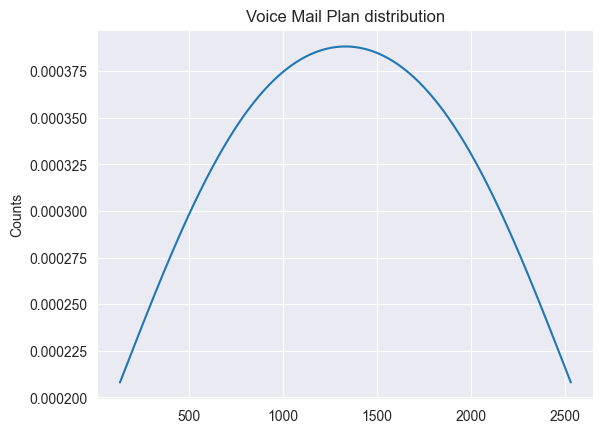

In [14]:


df[categorical_variable]['Voice mail plan'].value_counts().plot(kind='density')
plt.title("Voice Mail Plan distribution")
plt.ylabel("Counts")
plt.show()

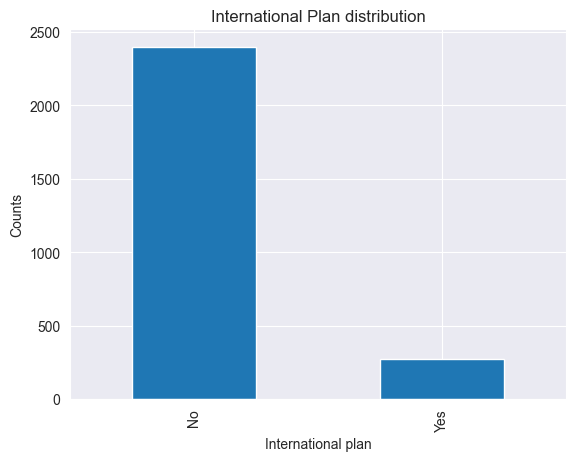

In [15]:
df[categorical_variable]['International plan'].value_counts().plot(kind='bar')
plt.title("International Plan distribution")
plt.ylabel("Counts")
plt.show()


<Axes: xlabel='State'>

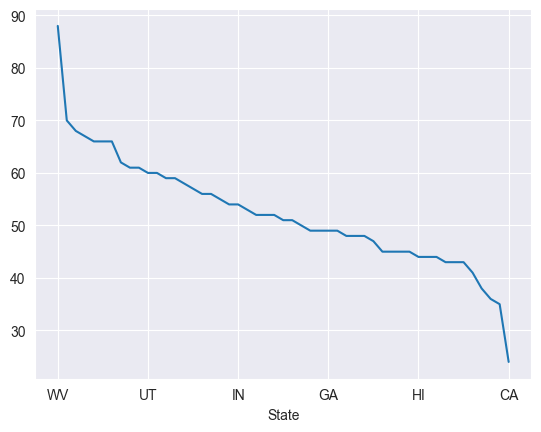

In [16]:
df[categorical_variable]['State'].value_counts().plot(kind='line')

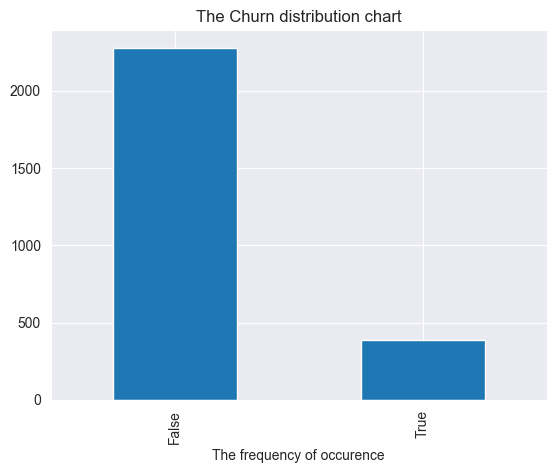

In [17]:
df["Churn"].value_counts().plot(kind='bar')
plt.title("The Churn distribution chart")
plt.xlabel("The frequency of occurence")
plt.show()

In [18]:
### Exploring the Numerical variables 

Numerical_variable

['Account length',
 'Area code',
 'Number vmail messages',
 'Total day minutes',
 'Total day calls',
 'Total day charge',
 'Total eve minutes',
 'Total eve calls',
 'Total eve charge',
 'Total night minutes',
 'Total night calls',
 'Total night charge',
 'Total intl minutes',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls']

In [19]:
df[Numerical_variable].corr()


,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
Account length,1.000000,-0.008620,-0.002996,0.002847,0.038862,0.002843,-0.015923,0.018552,-0.015909,-0.008994,-0.024007,-0.008999,0.011369,0.017627,0.011383,0.002455
Area code,-0.008620,1.000000,-0.000584,-0.023134,-0.009629,-0.023130,0.000679,-0.018602,0.000707,-0.003353,0.011455,-0.003382,-0.013418,-0.027423,-0.013534,0.034442
Number vmail messages,-0.002996,-0.000584,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787
Total day minutes,0.002847,-0.023134,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543
Total day calls,0.038862,-0.009629,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945
Total day charge,0.002843,-0.023130,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548
Total eve minutes,-0.015923,0.000679,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192
Total eve calls,0.018552,-0.018602,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058
Total eve charge,-0.015909,0.000707,0.011418,0.003992,-0.026006,0.004002,1.000000,-0.007642,1.000000,-0.013428,0.009030,-0.013464,-0.006923,0.002169,-0.006955,-0.013196
Total night minutes,-0.008994,-0.003353,-0.000224,0.013491,0.008986,0.013495,-0.013414,-0.000175,-0.013428,1.000000,0.012736,0.999999,-0.008607,-0.001110,-0.008510,0.005236


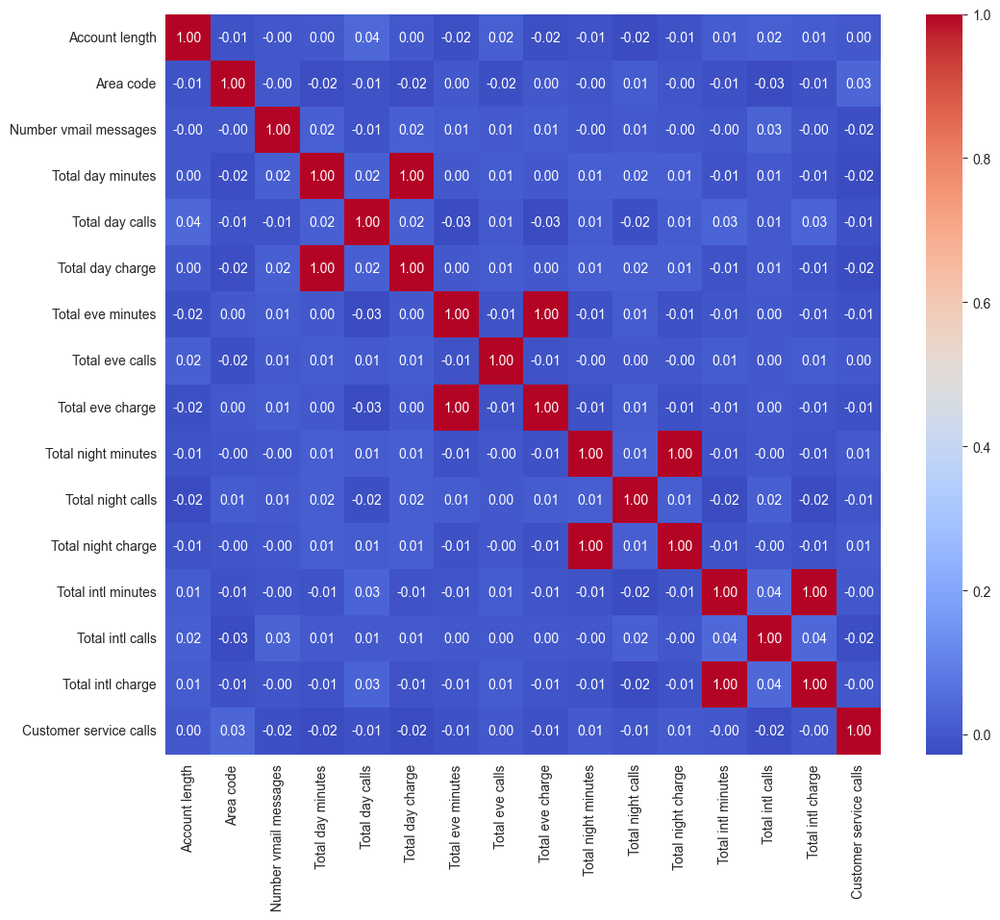

In [20]:
### Ploting the Numerical correlation using HEATMAOP CHART

plt.figure(figsize=(12,10))
sns.heatmap(
    df[Numerical_variable].corr(),
    annot=True,
    cmap='coolwarm',
    fmt = ".2f"
)
plt.show()

In [21]:
#### Handling the Categorical variable; converting them into numerical dtype for analysis computation

df['Churn'] = df['Churn'].astype('int64')

In [22]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [23]:
#### checking for duplicated row
df.duplicated().sum()

np.int64(0)

In [24]:
#### Droping of column that is not needed for this our analysis

columns = ['State','Area code']

df.drop(columns = columns, axis=1,inplace=True)

In [25]:
df.shape

(2666, 18)

In [26]:
categorical_variable

['State', 'International plan', 'Voice mail plan']

In [27]:
map = {
    "No":0,
    "Yes":1
}

df['International plan'] = df['International plan'].map(map)
df['Voice mail plan'] = df['Voice mail plan'].map(map)

In [28]:
df.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


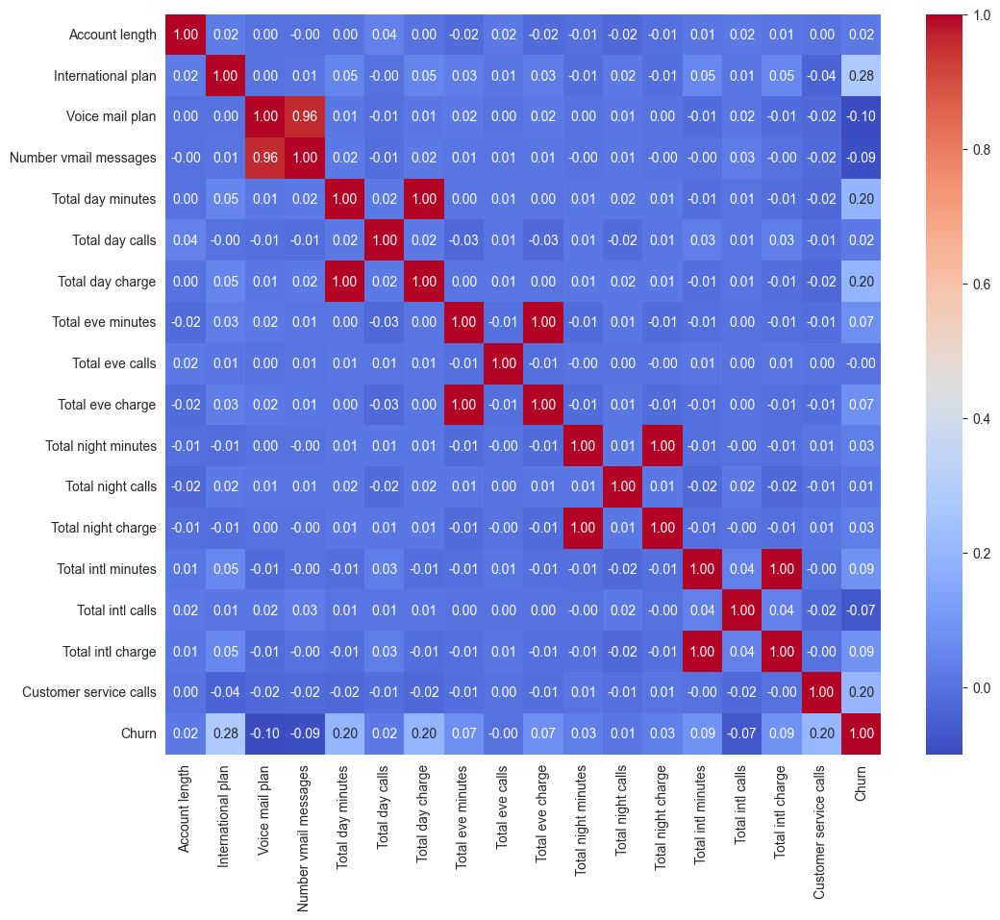

In [29]:
plt.figure(figsize=(12,10))
sns.heatmap(
    df.corr(),annot=True, cmap='coolwarm',fmt=".2f"
)
plt.show()

<Figure size 1200x1000 with 0 Axes>

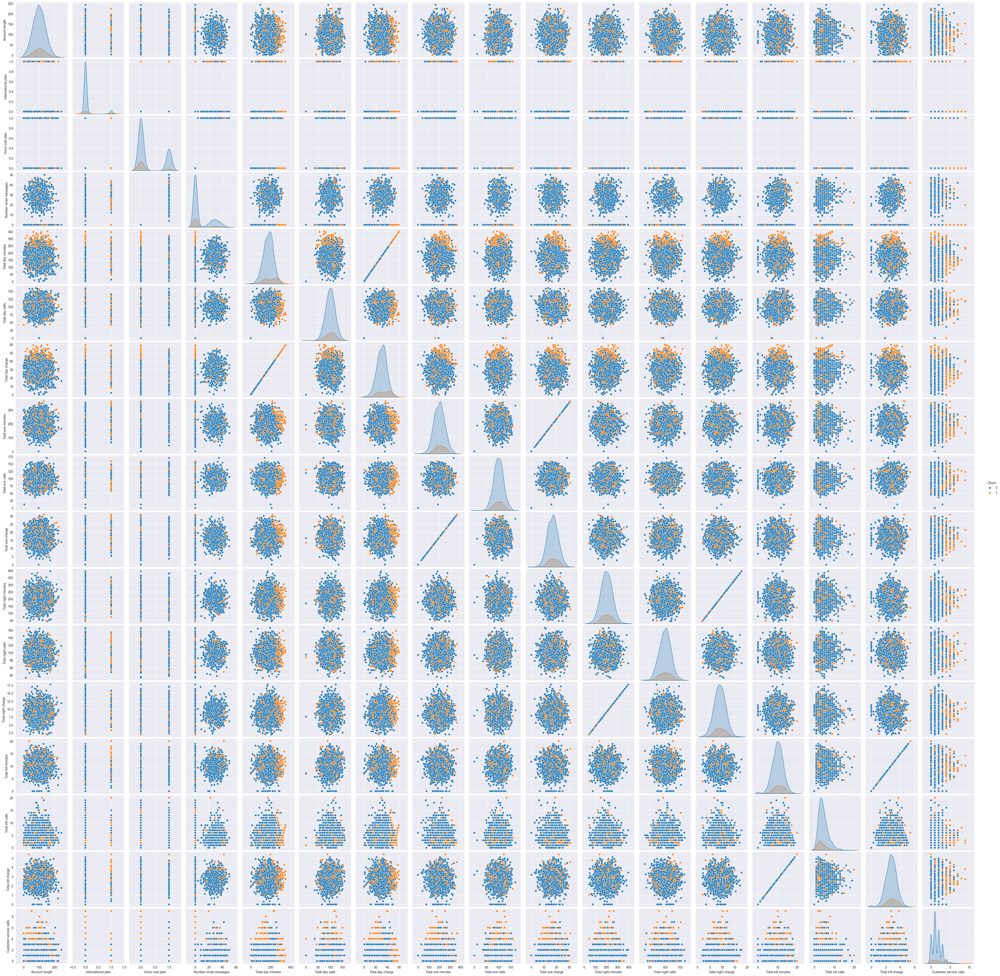

In [30]:
### Plotting a pairplot

plt.figure(figsize=(12,10))
sns.pairplot(data=df,hue='Churn')
plt.show()

In [50]:
#### Feature selection 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV

from sklearn.ensemble import RandomForestClassifier 
from sklearn.tree import DecisionTreeClassifier


from sklearn.metrics import accuracy_score,classification_report

In [34]:
df.select_dtypes(include=np.number)

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,79,0,0,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0
2662,192,0,1,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
2663,68,0,0,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
2664,28,0,0,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0


In [35]:
df.columns

Index(['Account length', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day minutes', 'Total day calls',
       'Total day charge', 'Total eve minutes', 'Total eve calls',
       'Total eve charge', 'Total night minutes', 'Total night calls',
       'Total night charge', 'Total intl minutes', 'Total intl calls',
       'Total intl charge', 'Customer service calls', 'Churn'],
      dtype='object')

<Axes: >

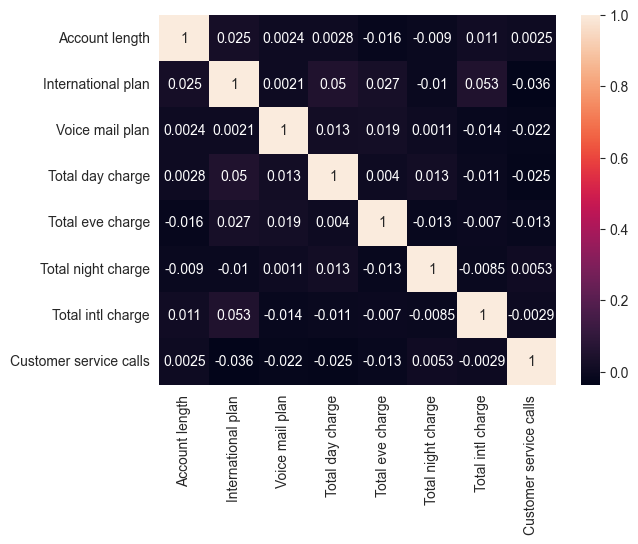

In [40]:
sns.heatmap(

df[['Account length', 'International plan', 'Voice mail plan',
       'Total day charge', 
       'Total eve charge', 
       'Total night charge',
       'Total intl charge', 'Customer service calls']].corr(),
       annot = True

)

In [ ]:
['Account length', 'International plan', 'Voice mail plan',
       'Number vmail messages',
       'Total day charge', 
       'Total eve charge', 
       'Total night charge', 'Total intl minutes', 'Total intl calls',
       'Total intl charge', 'Customer service calls'
       ]

In [41]:
Y = df['Churn']
X = df[['Account length', 'International plan', 'Voice mail plan',
       'Total day charge', 
       'Total eve charge', 
       'Total night charge',
       'Total intl charge', 'Customer service calls']]

In [43]:
#### Spliting the dataset 

X_train,X_test,y_train,y_test = train_test_split(X,Y, test_size=.20,stratify=Y,random_state = 42)

In [45]:
X_train.shape , X_test.shape

((2132, 8), (534, 8))

In [46]:
### Model building

random_model = RandomForestClassifier(
    n_estimators = 3,
    criterion = 'log_loss',
    random_state = 42
)

In [47]:
random_model.fit(X_train,y_train)

,n_estimators,3
,criterion,'log_loss'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [64]:
from sklearn.metrics import confusion_matrix

In [63]:
y_pred = random_model.predict(X_test)
print(f" The random forest model score: {random_model.score(X_test,y_test)}")

 The random forest model score: 0.9026217228464419


In [66]:
print(f"Classification matrix: {classification_report(y_test,y_pred)}")
print(f"The confusion Matrix : {confusion_matrix(y_test,y_pred)}")


Classification matrix:               precision    recall  f1-score   support

           0       0.92      0.96      0.94       456
           1       0.72      0.54      0.62        78

    accuracy                           0.90       534
   macro avg       0.82      0.75      0.78       534
weighted avg       0.90      0.90      0.90       534

The confusion Matrix : [[440  16]
 [ 36  42]]


<Axes: >

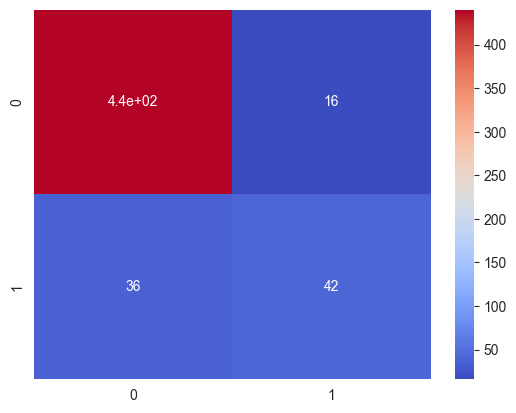

In [67]:
sns.heatmap(
    confusion_matrix(y_test,y_pred),annot = True, cmap='coolwarm'
)

In [89]:
#### Using GridSearchCV for hyperparimeter turning.

params = {
    'n_estimators' :[2,3,4],
    'criterion' : ['log_loss','sqrt'],
    'max_features' : ['log2','sqrt']
}

In [ ]:
grid = GridSearchCV (
    estimator= RandomForestClassifier(random_state=42),
    param_grid = params,
    cv=5,
    scoring='roc_auc',
    n_jobs = 1
)

grid.fit(X_train,y_train)

,estimator,RandomForestC...ndom_state=42)
,param_grid,"{'criterion': ['log_loss', 'sqrt'], 'max_features': ['log2', 'sqrt'], 'n_estimators': [2, 3, ...]}"
,scoring,'neg_mean_squared_error'
,n_jobs,1
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_estimators,4


In [92]:
print(f"The best parameters of the model: {grid.best_estimator_}")
print(f"The model score performance: {grid.best_score_}")
print(grid.feature_names_in_)


The best parameters of the model: RandomForestClassifier(criterion='log_loss', max_features='log2',
                       n_estimators=4, random_state=42)
The model score performance: -0.09333817110312145
['Account length' 'International plan' 'Voice mail plan'
 'Total day charge' 'Total eve charge' 'Total night charge'
 'Total intl charge' 'Customer service calls']


In [93]:
### Building for DecisionTree Classifier
X_train.shape , X_test.shape, y_train.shape, y_test.shape

((2132, 8), (534, 8), (2132,), (534,))

 confusion matrix for Decision Tree Model: [[420  36]
 [ 30  48]]
Classification report for Decision Tree Model:               precision    recall  f1-score   support

           0       0.93      0.92      0.93       456
           1       0.57      0.62      0.59        78

    accuracy                           0.88       534
   macro avg       0.75      0.77      0.76       534
weighted avg       0.88      0.88      0.88       534



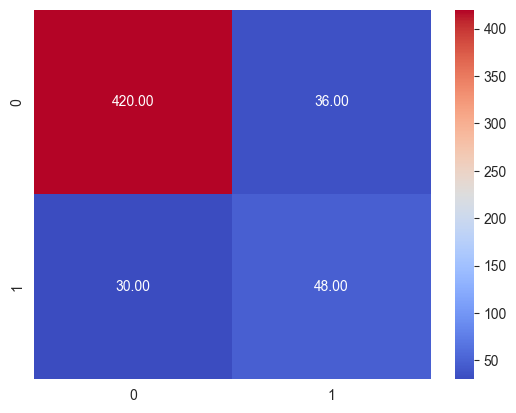

In [96]:
tree_model = DecisionTreeClassifier(random_state=42)

tree_model.fit(X_train,y_train)
y_pred = tree_model.predict(X_test)

print(f" confusion matrix for Decision Tree Model: {confusion_matrix(y_test,y_pred)}")
print(f"Classification report for Decision Tree Model: {classification_report(y_test,y_pred)}")

plt.figure()
sns.heatmap(
    confusion_matrix(y_test,y_pred), annot = True , fmt='.2f',cmap='coolwarm'

)
plt.show()


In [102]:
#### Using GridSearch for HyperTurning

params  = {
     "criterion": ['gini', 'entropy', 'log_loss'],
     "splitter": ['best', 'random'],
     "max_features": ['auto', 'sqrt', 'log2']
}

tree_grid = GridSearchCV(
    estimator = tree_model,
    param_grid = params,
    cv = 5,
    scoring = "roc_auc" ,
    n_jobs = 2
)
tree_grid.fit(X_train,y_train)
print(f"The best model estimator for the DecisionTreeClassifier: {tree_grid.best_estimator_}")
print(f"The best model score: {tree_grid.best_score_}")
print(f"The features used in the model: {tree_grid.best_params_}")

The best model estimator for the DecisionTreeClassifier: DecisionTreeClassifier(criterion='entropy', max_features='log2',
                       random_state=42)
The best model score: 0.7724580081871288
The features used in the model: {'criterion': 'entropy', 'max_features': 'log2', 'splitter': 'best'}


In [104]:
from sklearn.metrics import roc_auc_score

In [105]:
### Building the model using the best estimator from the gridsearchCV

tree_model = DecisionTreeClassifier(
    random_state=42,
    criterion= 'entropy',
    max_features='log2',
    splitter='best'

    )

tree_model.fit(X_train,y_train)
y_pred = tree_model.predict(X_test)

print(f" confusion matrix for Decision Tree Model: {confusion_matrix(y_test,y_pred)}")
print(f"Classification report for Decision Tree Model: {classification_report(y_test,y_pred)}")
print (f"The roc_auc_score: {roc_auc_score(y_test,y_pred)}")

 confusion matrix for Decision Tree Model: [[419  37]
 [ 30  48]]
Classification report for Decision Tree Model:               precision    recall  f1-score   support

           0       0.93      0.92      0.93       456
           1       0.56      0.62      0.59        78

    accuracy                           0.87       534
   macro avg       0.75      0.77      0.76       534
weighted avg       0.88      0.87      0.88       534

The roc_auc_score: 0.7671221322537112
